In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from clean import clean_data
import random
from ydata_profiling import ProfileReport

In [2]:
seed = 777

# Analyze original data

In [3]:
file_path = "../data/TBI PUD 10-08-2013.csv"
df_origin = pd.read_csv(file_path, na_values=[""], index_col=0)
df_origin = df_origin.astype("Int64")
# Replace multiple values with np.nan one at a time
df_origin = df_origin.replace(pd.NA, np.nan)
df_origin = df_origin.replace([90, 91, 92], np.nan)

In [4]:
# Checking missing values
missing_ratio = df_origin.isnull().mean()

# Pick up 11 values of missing ratio
percentiles = np.arange(0, 110, 10)
thresholds = np.percentile(missing_ratio.dropna(), percentiles)
missing_ratio_sorted = pd.Series(missing_ratio).sort_values(ascending=False)
ranks = pd.Series(
    range(1, len(missing_ratio_sorted) + 1), index=missing_ratio_sorted.index
)
threshold_ranks = [(t, ranks[missing_ratio_sorted >= t].max()) for t in thresholds]

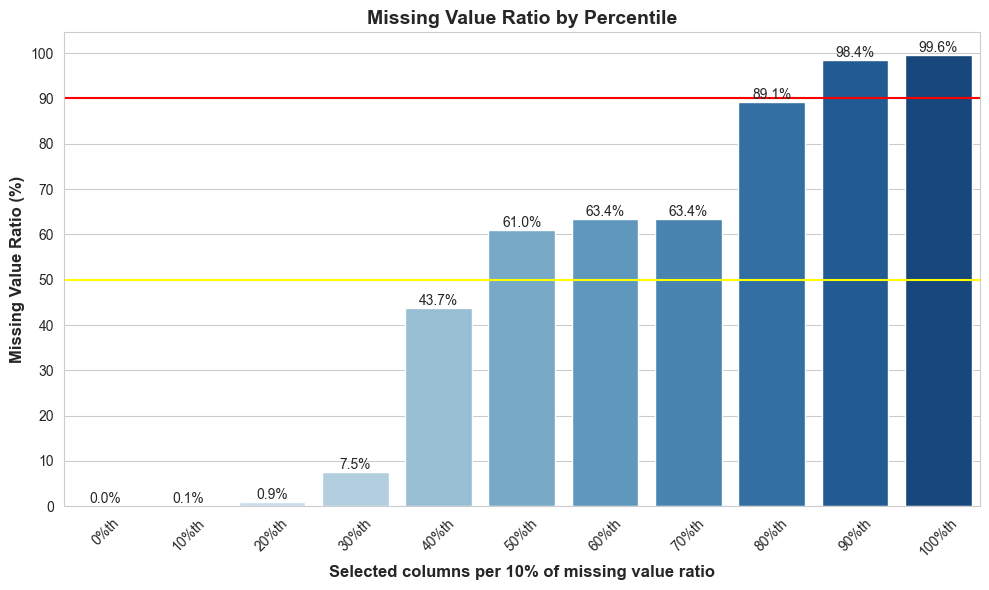

In [5]:
# make bar plot
sns.set_style("whitegrid")

thresholds_vals = [x[0] * 100 for x in threshold_ranks]  # Convert to percentage
ranks_vals = [x[1] for x in threshold_ranks]
categories = [f"{p}%th" for p in percentiles]

plt.figure(figsize=(10, 6))
ax = sns.barplot(
    x=categories, y=thresholds_vals, hue=categories, palette="Blues", legend=False
)
ax.set_xlabel(
    "Selected columns per 10% of missing value ratio", fontsize=12, fontweight="bold"
)
ax.set_ylabel("Missing Value Ratio (%)", fontsize=12, fontweight="bold")
ax.set_title("Missing Value Ratio by Percentile", fontsize=14, fontweight="bold")
ax.axhline(90, color="red", linewidth=1.5)
ax.axhline(50, color="yellow", linewidth=1.5)
ax.set_yticks(np.arange(0, 101, 10))


for i, bar in enumerate(ax.patches):
    yval = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        yval,
        f"{yval:.1f}%",
        ha="center",
        va="bottom",
        fontsize=10,
    )

plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("../figs/missing_value_ratio.pdf")
plt.show()

# Preprocessing

In [6]:
df, train_df, test_df = clean_data(file_path)
file_path = "../data/preprossed TBI PUD 10-08-2013.csv"
df.to_csv(file_path)
file_path = "../data/train TBI PUD 10-08-2013.csv"
train_df.to_csv(file_path)
file_path = "../data/test TBI PUD 10-08-2013.csv"
test_df.to_csv(file_path)

# Checking Data

In [7]:
unique_counts = df.nunique()
unique_counts

InjuryMech             13
High_impact_InjSev      3
Amnesia_verb            2
LocLen                  6
SeizOccur               5
SeizLen                 6
ActNorm                 2
HASeverity              5
HAStart                 6
VomitNbr                5
VomitStart              6
VomitLast               5
Dizzy                   2
Intubated               2
Paralyzed               2
Sedated                 2
GCSEye                  4
GCSVerbal               5
GCSMotor                6
GCSTotal               13
AMS                     2
AMSAgitated             2
AMSSleep                2
AMSSlow                 2
AMSRepeat               2
AMSOth                  2
SFxPalpDepress          4
FontBulg                2
SFxBasHem               3
SFxBasOto               3
SFxBasPer               3
SFxBasRet               3
SFxBasRhi               3
HemaLoc                 5
HemaSize                5
ClavFace                2
ClavNeck                2
ClavFro                 2
ClavOcc     

In [8]:
unique_values = pd.DataFrame(
    {
        "Unique Values": [
            sorted([x for x in df[col].unique() if pd.notna(x)]) for col in df.columns
        ]
    },
    index=df.columns,
)
unique_values

,Unique Values
InjuryMech,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]"
High_impact_InjSev,"[1, 2, 3]"
Amnesia_verb,"[0, 1]"
LocLen,"[0, 1, 2, 3, 4, 5]"
SeizOccur,"[0, 1, 2, 3, 4]"
SeizLen,"[0, 1, 2, 3, 4, 5]"
ActNorm,"[0, 1]"
HASeverity,"[0, 1, 2, 3, 4]"
HAStart,"[0, 1, 2, 3, 4, 5]"
VomitNbr,"[0, 1, 2, 3, 4]"


# Pandas Profiling

In [9]:
profile = ProfileReport(train_df, title="train_EDA")
profile.to_notebook_iframe()
profile.to_file("../report/train_EDA.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Distribution


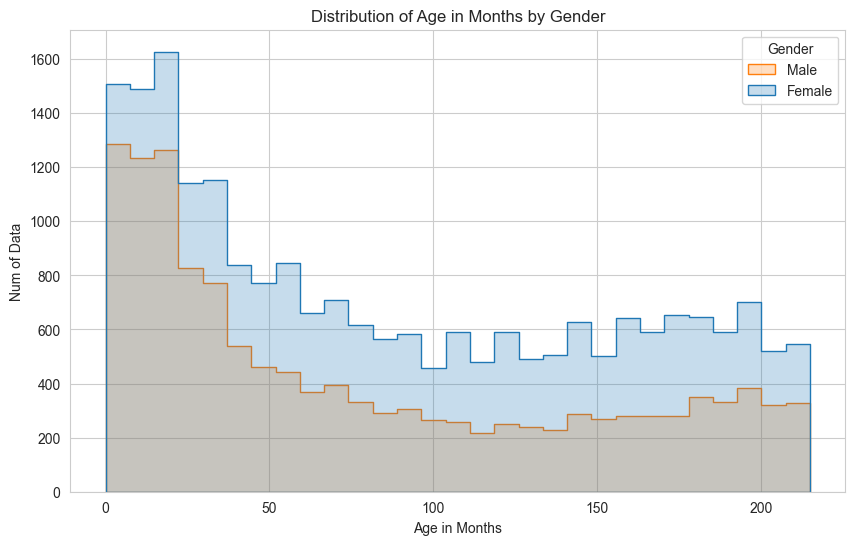

In [10]:
# Gender and Age Distribution
gender_mapping = {1: "Male", 2: "Female"}
df["Gender"] = train_df["Gender"].map(gender_mapping)

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="AgeInMonth", hue="Gender", element="step", common_norm=False)
plt.xlabel("Age in Months")
plt.ylabel("Num of Data")
plt.title("Distribution of Age in Months by Gender")
plt.legend(title="Gender", labels=["Male", "Female"])
plt.savefig("../figs/Age_in_Months_by_Gender.pdf")
plt.show()

C:\Users\jyuny\AppData\Local\Temp\ipykernel_28376\3280606532.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=race_counts.index, y=race_counts.values, palette="viridis")


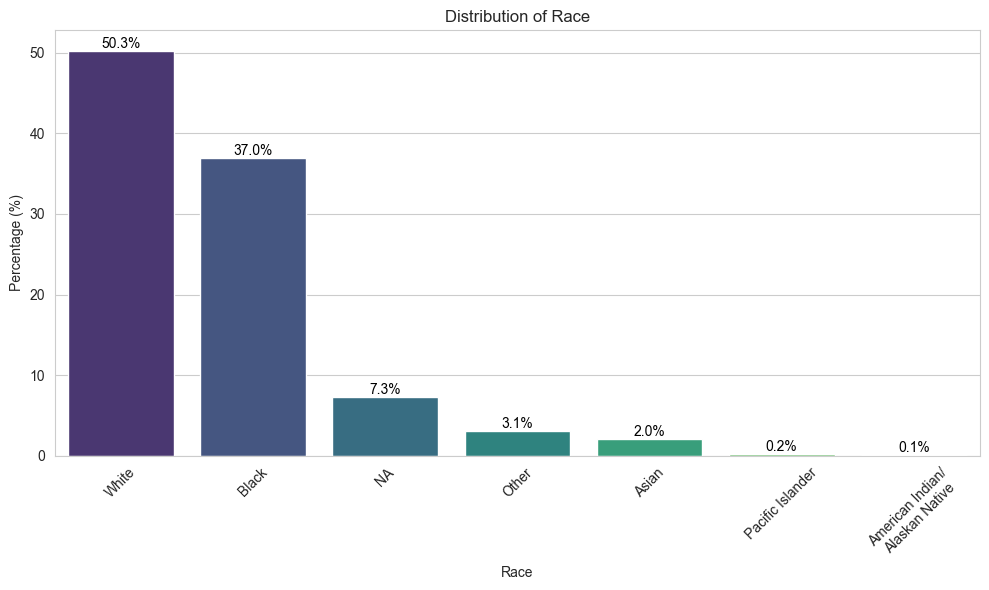

In [11]:
# Race Distribution
race_counts = train_df["Race"].value_counts(dropna=False, normalize=True) * 100
race_labels = {
    1: "White",
    2: "Black",
    3: "Asian",
    4: "American Indian/\nAlaskan Native",
    5: "Pacific Islander",
    6: "Other",
    np.nan: "NA",
}
race_counts.index = race_counts.index.map(
    lambda x: "NA" if pd.isnull(x) else race_labels.get(x, x)
)


sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

ax = sns.barplot(x=race_counts.index, y=race_counts.values, palette="viridis")

for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f"{height:.1f}%",
        (p.get_x() + p.get_width() / 2, height),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
    )

plt.xlabel("Race")
plt.ylabel("Percentage (%)")
plt.title("Distribution of Race")
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.savefig("../figs/Race_Distribution.pdf", format="pdf")
plt.show()

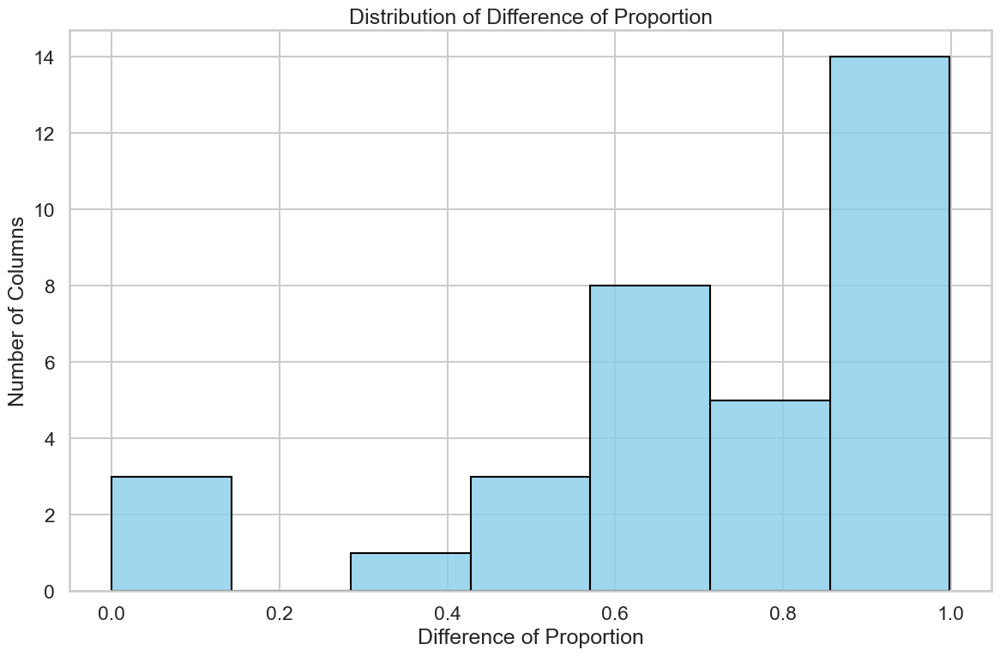

In [12]:
# Biase in the Ratio of 0s and 1s
binary_columns = [
    col
    for col in train_df.columns
    if set(train_df[col].dropna().unique()).issubset({0, 1})
]
abs_diff_list = []
for col in binary_columns:
    prop0 = (train_df[col] == 0).sum() / len(train_df[col].dropna())
    prop1 = (train_df[col] == 1).sum() / len(train_df[col].dropna())
    abs_diff_list.append(abs(prop0 - prop1))

sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(12, 8))
ax = sns.histplot(
    abs_diff_list, kde=False, color="skyblue", edgecolor="black", alpha=0.8
)
plt.xlabel("Difference of Proportion")
plt.ylabel("Number of Columns")
plt.title("Distribution of Difference of Proportion")
plt.tight_layout()
plt.show()

# NA values

After this, I will use only train_data

In [13]:
row_missing = train_df.isna().sum(axis=1) / train_df.shape[1]
col_missing = train_df.isna().sum() / train_df.shape[0]
print("\nTop 10 rows with highest missing rate:")
print(row_missing.sort_values(ascending=False).head(10))

print("\nTop 10 columns with highest missing rate:")
print(col_missing.sort_values(ascending=False).head(10))


Top 10 rows with highest missing rate:
PatNum
29196    0.783333
5542     0.766667
41113    0.750000
29726    0.750000
11930    0.733333
21371    0.700000
32713    0.683333
8972     0.666667
31401    0.666667
26190    0.616667
dtype: float64

Top 10 columns with highest missing rate:
NeuroDReflex     0.984389
NeuroDCranial    0.984389
NeuroDSensory    0.984389
NeuroDMotor      0.984389
OSIAbdomen       0.894726
OSIFlank         0.894726
OSICspine        0.894726
OSICut           0.894726
OSIExtremity     0.894726
OSIPelvis        0.894726
dtype: float64


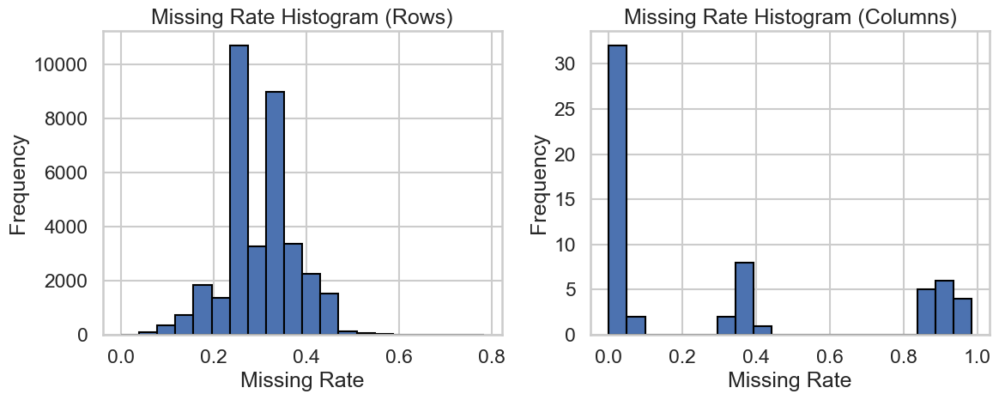

In [14]:
# Missing Rate Histogram
plt.figure(figsize=(12, 5))


plt.subplot(1, 2, 1)


plt.hist(row_missing, bins=20, edgecolor="black")


plt.title("Missing Rate Histogram (Rows)")


plt.xlabel("Missing Rate")


plt.ylabel("Frequency")


plt.subplot(1, 2, 2)


plt.hist(col_missing, bins=20, edgecolor="black")


plt.title("Missing Rate Histogram (Columns)")


plt.xlabel("Missing Rate")


plt.ylabel("Frequency")


plt.tight_layout()


plt.show()

In [15]:
cat_columns = train_df.columns.tolist()

nan_similarity_matrix = pd.DataFrame(
    index=cat_columns, columns=cat_columns, dtype=float
)

# Calculate pairwise nan similarities between columns
# For each pair of columns:
# - Count how many columns have matching NaN status (both NaN or both non-NaN)
# - Divide by total number of rows to get similarity score
for col1 in cat_columns:
    for col2 in cat_columns:
        both_nan = train_df[col1].isna() & train_df[col2].isna()
        both_not_nan = (~train_df[col1].isna()) & (~train_df[col2].isna())
        same = both_nan | both_not_nan
        similarity = same.sum() / len(same)
        nan_similarity_matrix.loc[col1, col2] = similarity

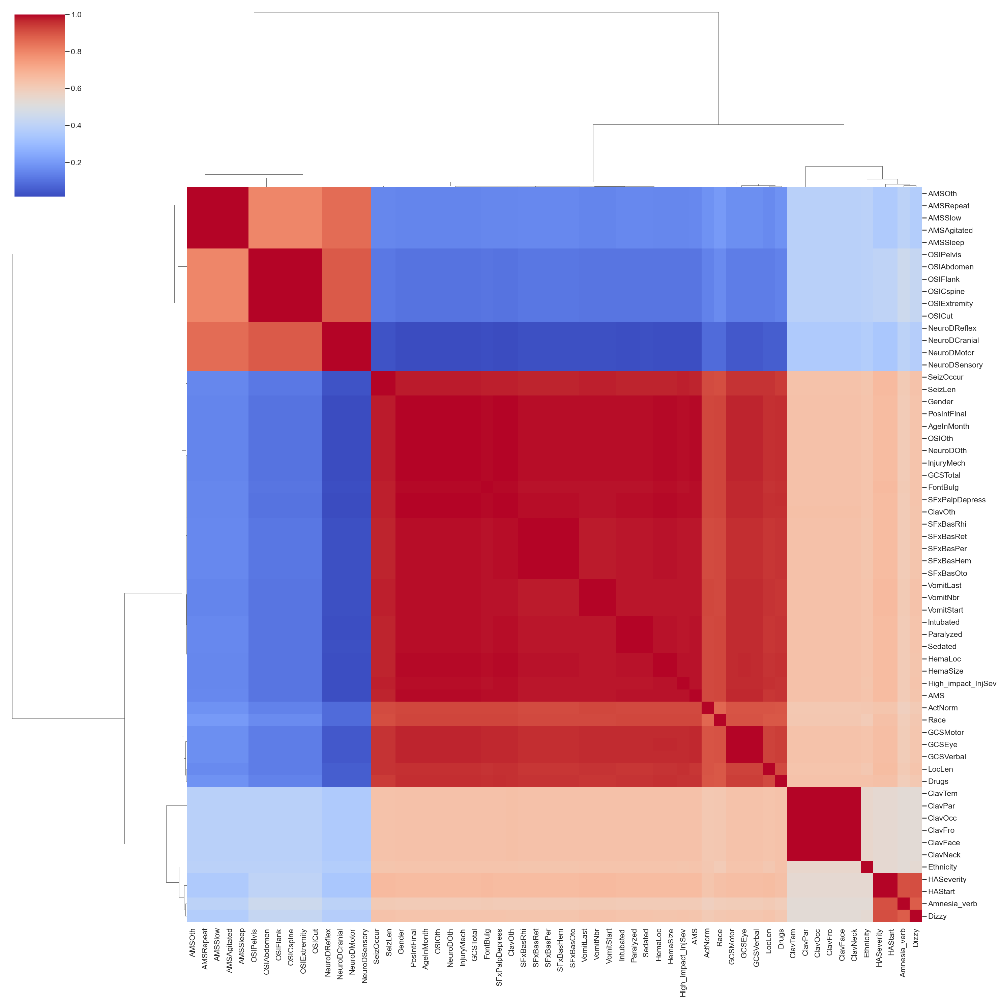

In [16]:
sns.clustermap(
    nan_similarity_matrix,
    cmap="coolwarm",
    annot=False,
    method="ward",
    figsize=(30, 30),
    xticklabels=True,
    yticklabels=True,
)
plt.show()

# Correlation Matrix

In [17]:
# Drop InjuryMech and Race because they have more than three categories but can't be ranked.
df_corr = train_df.drop(
    [
        "InjuryMech",
        "Race",
    ],
    axis=1,
)

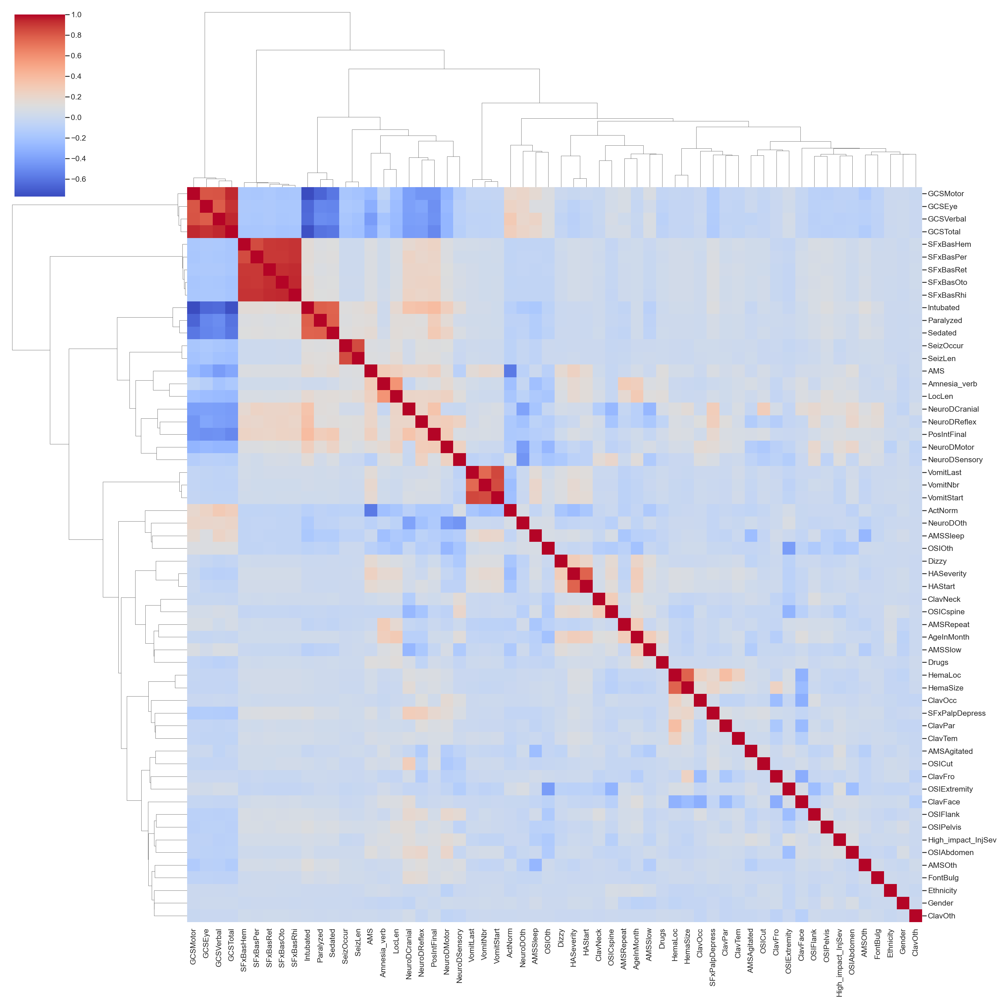

In [18]:
# Calculate correlation Matrix(Pearson)

correlation_matrix = df_corr.corr(method="pearson", min_periods=5)

sns.clustermap(
    correlation_matrix.fillna(0),  # Fill NaN with 0 only in this chart
    cmap="coolwarm",
    annot=False,
    method="ward",
    figsize=(30, 30),
    xticklabels=True,
    yticklabels=True,
)

plt.show()

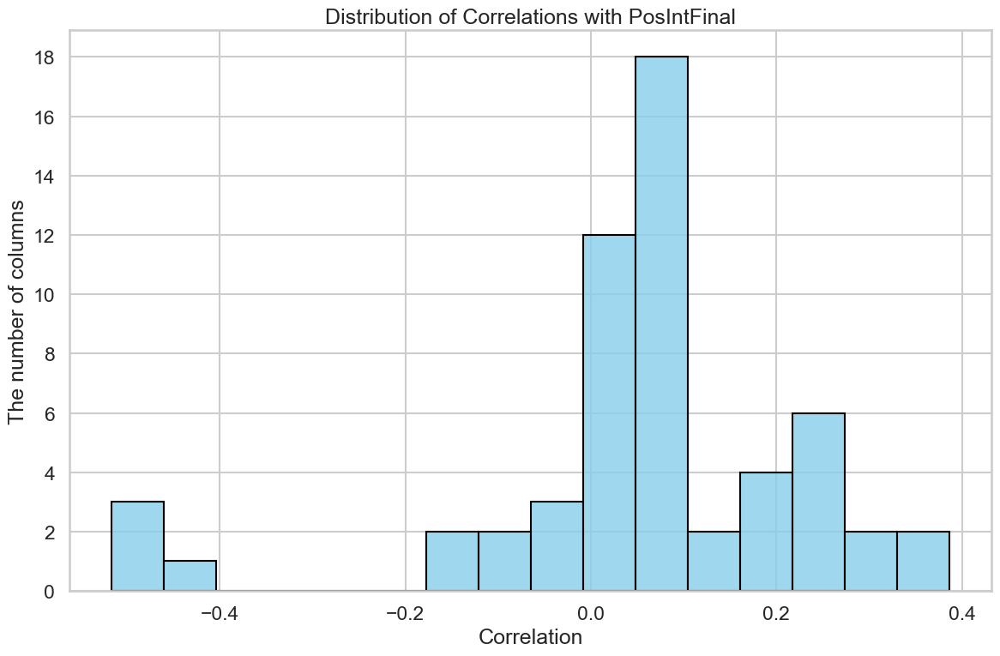

In [19]:
# Calculate correlations with PosIntFinal
correlations_with_citbi = (
    correlation_matrix["PosIntFinal"].drop("PosIntFinal").sort_values(ascending=False)
)

sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(12, 8))
ax = sns.histplot(
    correlations_with_citbi, kde=False, color="skyblue", edgecolor="black", alpha=0.8
)
ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.title("Distribution of Correlations with PosIntFinal")
plt.xlabel("Correlation")
plt.ylabel("The number of columns")
plt.tight_layout()
# plt.savefig("../figs/Cor_with_PosIntFinal.pdf", format="pdf")
plt.show()

In [20]:
# Top 10 Correlated Cols with ciTBI
correlations_with_citbi.head(11)

Intubated        0.386620
NeuroDCranial    0.336939
Sedated          0.297212
NeuroDMotor      0.285511
Paralyzed        0.273334
NeuroDReflex     0.262450
AMS              0.247870
SFxBasHem        0.232742
SFxBasOto        0.228781
SFxBasRhi        0.220040
LocLen           0.215683
Name: PosIntFinal, dtype: float64

In [21]:
# Top 10 Negative Correlated Cols with ciTBI
correlations_with_citbi.tail(11)

OSIExtremity   -0.014001
AMSSlow        -0.032086
OSICspine      -0.049511
OSIOth         -0.091694
AMSSleep       -0.114848
NeuroDOth      -0.150998
ActNorm        -0.167240
GCSMotor       -0.459895
GCSVerbal      -0.475509
GCSEye         -0.478832
GCSTotal       -0.516659
Name: PosIntFinal, dtype: float64

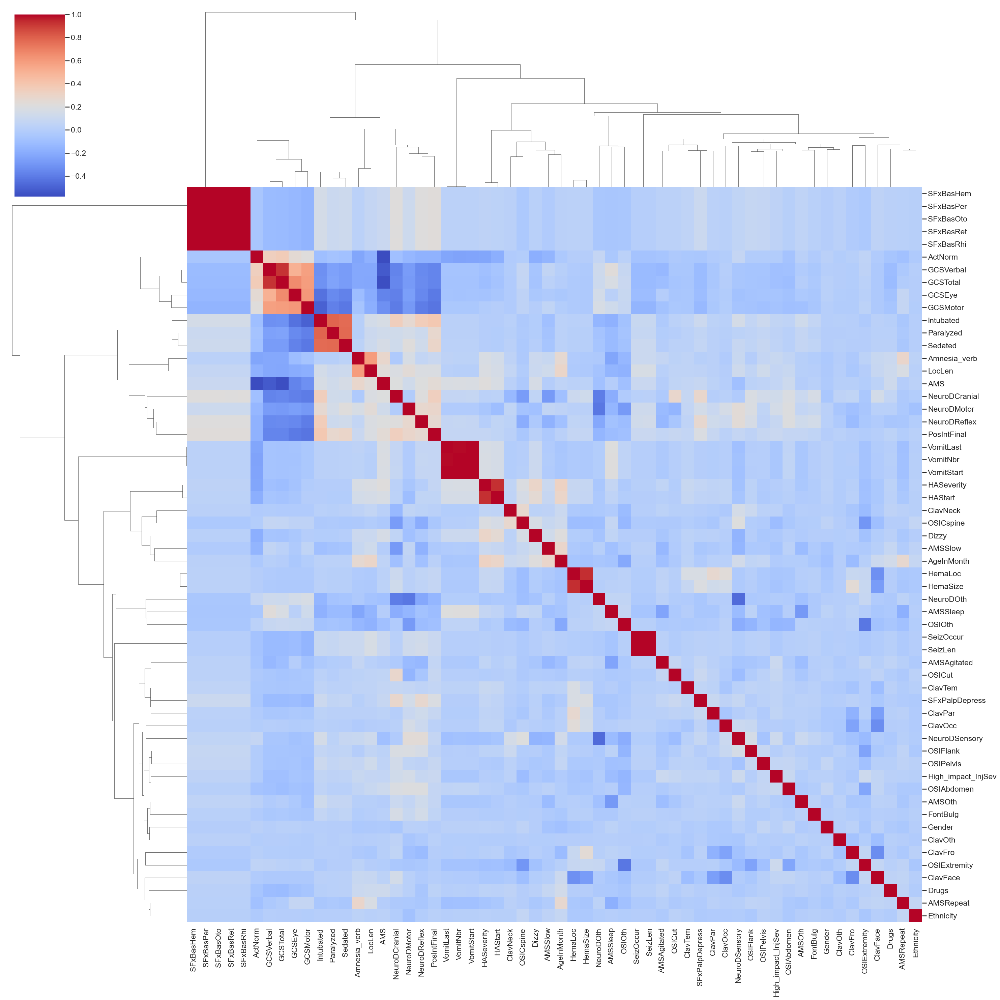

In [22]:
# Calculate correlation Matrix(Spearman)

s_correlation_matrix = df_corr.corr(method="spearman", min_periods=5)

sns.clustermap(
    s_correlation_matrix.fillna(0),  # Fill NaN with 0 only in this chart
    cmap="coolwarm",
    annot=False,
    method="ward",
    figsize=(30, 30),
    xticklabels=True,
    yticklabels=True,
)

plt.show()

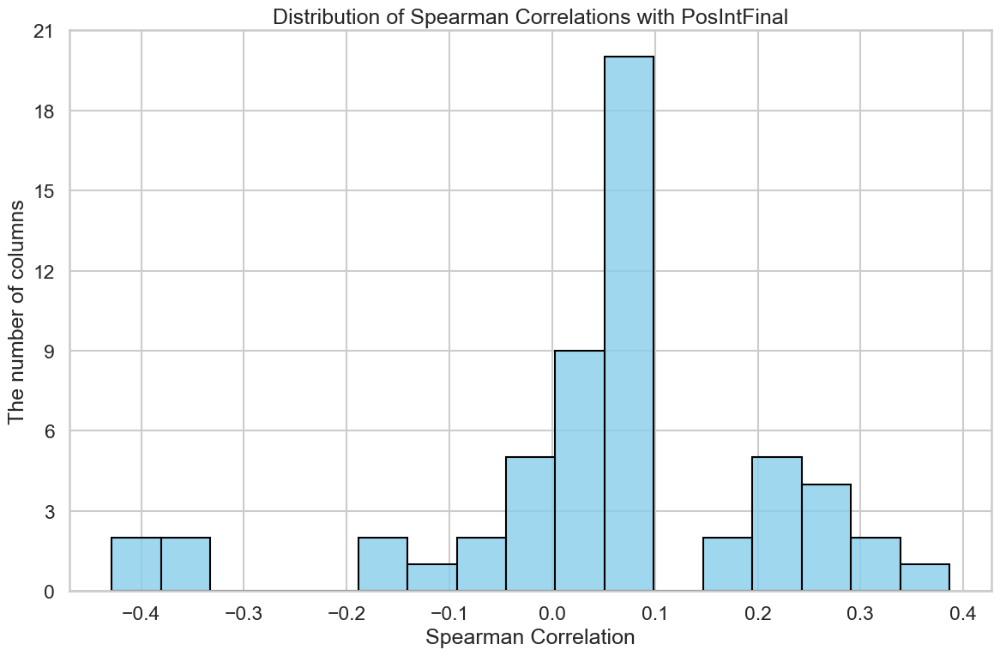

In [23]:
# Calculate correlations with PosIntFinal
s_correlations_with_citbi = (
    s_correlation_matrix["PosIntFinal"].drop("PosIntFinal").sort_values(ascending=False)
)

sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(12, 8))
ax = sns.histplot(
    s_correlations_with_citbi, kde=False, color="skyblue", edgecolor="black", alpha=0.8
)
ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.title("Distribution of Spearman Correlations with PosIntFinal")
plt.xlabel("Spearman Correlation")
plt.ylabel("The number of columns")
plt.tight_layout()
plt.savefig("../figs/Spearman_Cor_with_PosIntFinal.pdf", format="pdf")
plt.show()

In [24]:
# Top 10 Correlated Cols with ciTBI
abs(s_correlations_with_citbi).head(11)

Intubated        0.386620
NeuroDCranial    0.336939
Sedated          0.297212
NeuroDMotor      0.285511
Paralyzed        0.273334
NeuroDReflex     0.262450
AMS              0.247870
SFxBasHem        0.229390
SFxBasOto        0.229247
SFxBasPer        0.229157
SFxBasRhi        0.229133
Name: PosIntFinal, dtype: float64

In [25]:
# Top 10 Negative Correlated Cols with ciTBI
s_correlations_with_citbi.tail(11)

OSIExtremity   -0.014001
AMSSlow        -0.032086
OSICspine      -0.049511
OSIOth         -0.091694
AMSSleep       -0.114848
NeuroDOth      -0.150998
ActNorm        -0.167240
GCSVerbal      -0.362581
GCSTotal       -0.367176
GCSEye         -0.407562
GCSMotor       -0.428655
Name: PosIntFinal, dtype: float64

# Importance of Variables

In [26]:
importance = {}
for col in train_df.columns:
    if col == "PosIntFinal":
        continue
    ratios = train_df.groupby(col, dropna=False)["PosIntFinal"].mean()
    diff = ratios.max() - ratios.min()
    importance[col] = diff

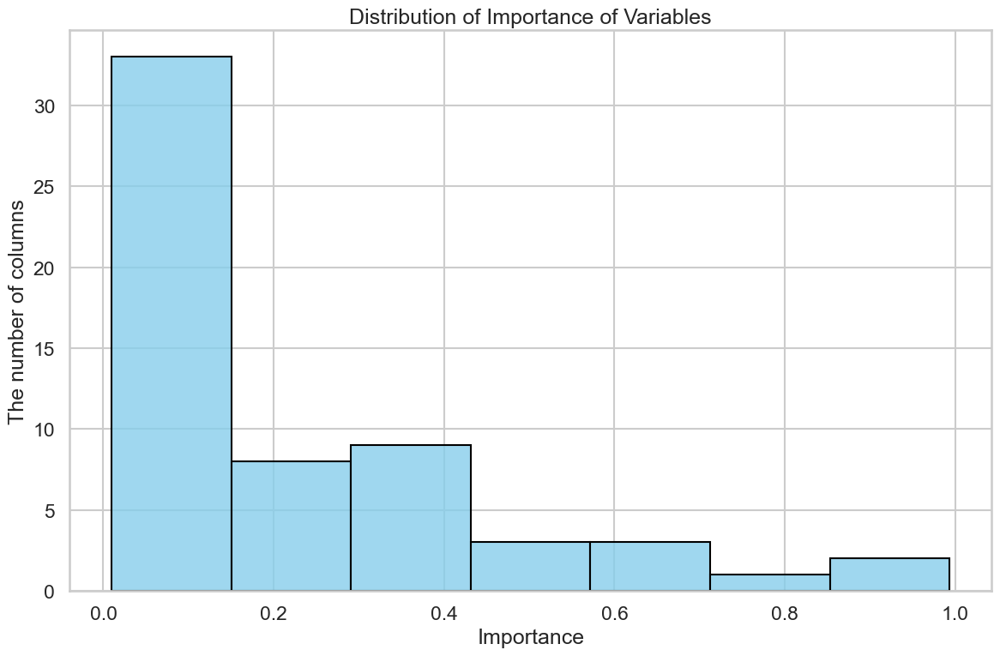

In [27]:
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(12, 8))
ax = sns.histplot(importance, kde=False, color="skyblue", edgecolor="black", alpha=0.8)
plt.title("Distribution of Importance of Variables")
plt.xlabel("Importance")
plt.ylabel("The number of columns")
plt.tight_layout()
plt.savefig("../figs/Importance_of_Variables.pdf", format="pdf")
plt.show()

In [28]:
# Top 10 importance
sorted(importance.items(), key=lambda x: x[1], reverse=True)[:11]

[('GCSTotal', 0.9932446824696467),
 ('GCSMotor', 0.989990322970848),
 ('Intubated', 0.7134778886748769),
 ('GCSEye', 0.7022326615195735),
 ('Paralyzed', 0.6416926175993911),
 ('GCSVerbal', 0.6155143717428241),
 ('Sedated', 0.5562204448595948),
 ('NeuroDReflex', 0.524915997719345),
 ('SFxBasOto', 0.436721723386173),
 ('SFxPalpDepress', 0.425531914893617),
 ('SeizLen', 0.4238823687511199)]

# Stability Check


In [29]:
# Bootstrap Sample
bootstrap_sample = train_df.sample(n=len(train_df), replace=True, random_state=seed)

In [30]:
# Calculate Importance of Bootstrap Sample
bs_importance = {}
for col in bootstrap_sample.columns:
    if col == "PosIntFinal":
        continue
    ratios = bootstrap_sample.groupby(col, dropna=False)["PosIntFinal"].mean()
    diff = ratios.max() - ratios.min()
    bs_importance[col] = diff

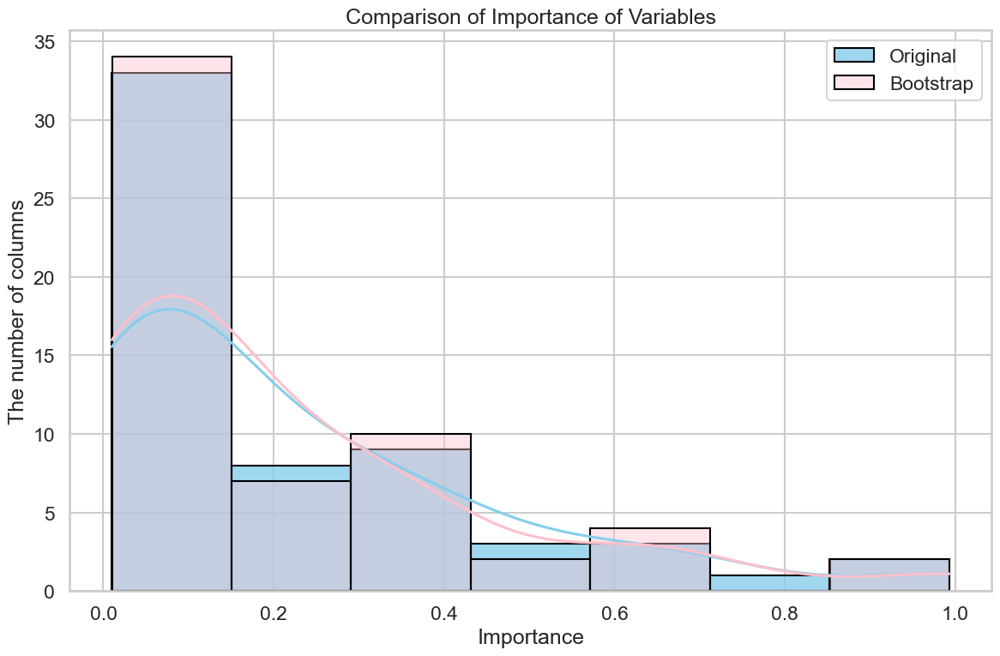

In [31]:
# Compare Importance of Bootstrap Sample and Original
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(12, 8))

ax = sns.histplot(
    importance,
    kde=True,
    color="skyblue",
    edgecolor="black",
    alpha=0.8,
    label="Original",
)
ax = sns.histplot(
    bs_importance,
    kde=True,
    color="pink",
    edgecolor="black",
    alpha=0.4,
    label="Bootstrap",
)


plt.title("Comparison of Importance of Variables")
plt.xlabel("Importance")
plt.ylabel("The number of columns")
plt.legend()
plt.tight_layout()
plt.savefig("../figs/Effectiveness_of_Bootstrap.pdf", format="pdf")
plt.show()